# Clusterização - Matemática Computacional

## 2. Importando as bibliotecas e as funções

In [128]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans

sns.set_theme(style="ticks")

### Criando versão nativa do Mini Batch K-Means

In [129]:
class MiniBatchKMeansNative:
    def __init__(self, n_clusters=8, max_iter=100, batch_size=100, learning_rate=0.01):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.batch_size = batch_size
        self.learning_rate = learning_rate

    def initialize_centroids(self, X):
        indices = np.random.choice(X.shape[0], size=self.n_clusters, replace=False)
        clusterCounts = np.zeros(self.n_clusters, dtype=int)
        return X[indices], clusterCounts

    def find_closest_centroids(self, X, centroids):
        distances = np.sqrt(((X - centroids[:, np.newaxis]) ** 2).sum(axis=2))
        return np.argmin(distances, axis=0)

    def update_centroids(self, XM,XM_indices,d,centroids,clusterCounts):
        """ print("XM",XM)
        print("XM_indices",XM_indices)
        print("d",d)
        print("centroids",centroids)
        print("clusterCounts",clusterCounts) """
        """ clusterCounts += np.bincount(d, minlength=len(clusterCounts))
        learningRate = 1 / clusterCounts.astype(float)
        centroids = centroids + learningRate*(XM-d) """
        for i in range(len(XM)):
            clusterCounts[d[i]] += 1
            learningRate = 1/clusterCounts[d[i]]
            centroids[d[i]] = centroids[d[i]] + learningRate*(XM[i]-centroids[d[i]])

    def select_random_samples(self,X):
        indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        random_samples = X[indices]
        return indices, random_samples

    def fit(self, X):
        centroids, clusterCounts = self.initialize_centroids(X)  
        n_samples = X.shape[0]

        if self.batch_size > n_samples:
            self.batch_size = n_samples          

        for _ in range(self.max_iter):
            """ indices = np.random.choice(n_samples, size=self.batch_size, replace=False)
            X_batch = X[indices]

            labels = self.find_closest_centroids(X_batch, centroids)
            self.update_centroids(X_batch, labels, centroids)

            centroids = centroids + self.learning_rate * (X_batch[:, np.newaxis, :] - centroids[labels]) """
            XM_indices, XM = self.select_random_samples(X)
            d = self.find_closest_centroids(XM,centroids)
            self.update_centroids(XM,XM_indices,d,centroids,clusterCounts)

           
        self.centroids = centroids

    def predict(self, X):
        return self.find_closest_centroids(X, self.centroids)


    
""" # Criar uma matriz de dados de exemplo
X = np.array([[79.408289, 152.834424], [98.046263, 186.910700], [240.578979, 48.473684], [109.687183, 277.945769], [249.626082, 229.753352], [358.131243, 445.470938]])

# Criar uma instância do MiniBatchKMeans e ajustar os dados
kmeans = MiniBatchKMeansNative(n_clusters=2)
kmeans.fit(X)

# Obter os rótulos previstos para os dados
labels = kmeans.predict(X)
print(labels) """

' # Criar uma matriz de dados de exemplo\nX = np.array([[79.408289, 152.834424], [98.046263, 186.910700], [240.578979, 48.473684], [109.687183, 277.945769], [249.626082, 229.753352], [358.131243, 445.470938]])\n\n# Criar uma instância do MiniBatchKMeans e ajustar os dados\nkmeans = MiniBatchKMeansNative(n_clusters=2)\nkmeans.fit(X)\n\n# Obter os rótulos previstos para os dados\nlabels = kmeans.predict(X)\nprint(labels) '

## 3.?. Análise do Mini Batch K-Means do Scikit-Learn

### 3.?.1. Clustering Exercises

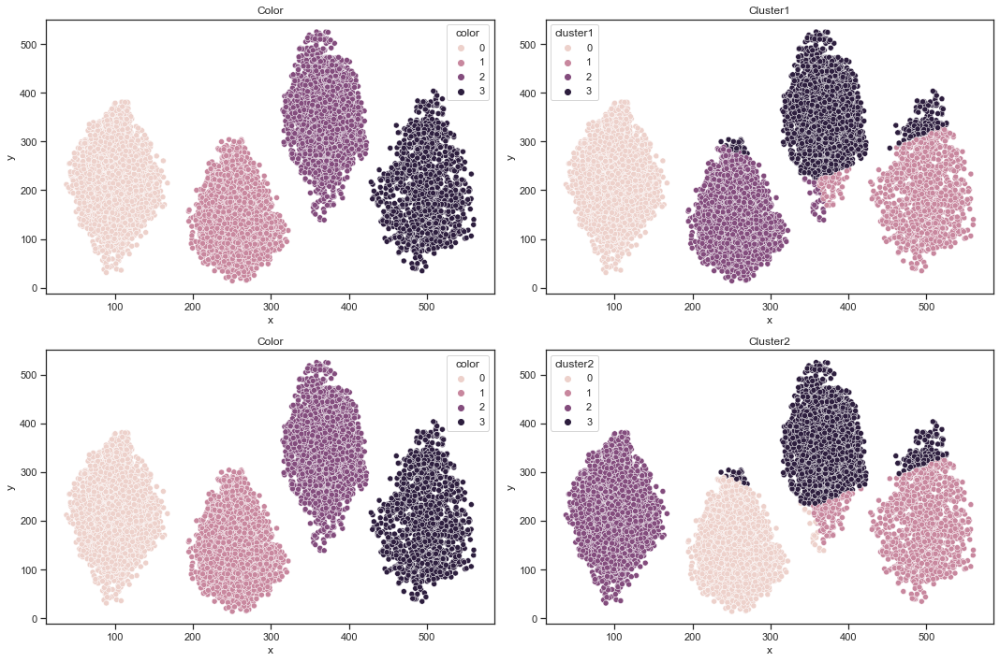

In [130]:
df_basic1 = pd.read_csv("./data/exercises/basic1.csv")
clustering1 = MiniBatchKMeans(n_clusters=4)
clustering2 = MiniBatchKMeansNative(n_clusters=4)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_basic1[["x", "y"]].to_numpy())
    labels = clustering.predict(df_basic1[["x", "y"]].to_numpy())
    df_basic1[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_basic1, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_basic1, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_basic1, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_basic1, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

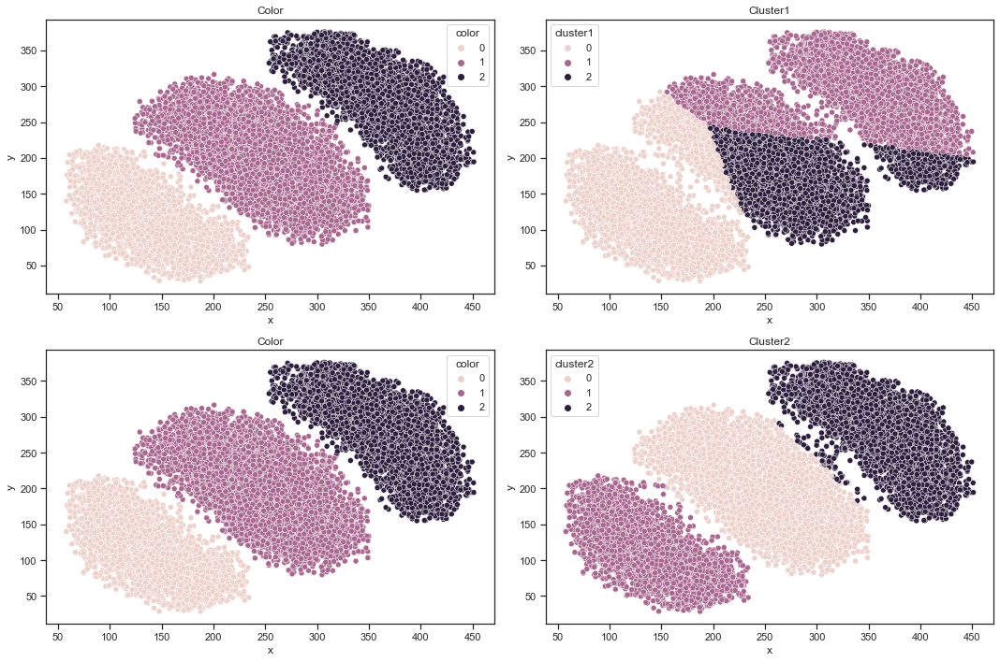

In [131]:
df_basic4 = pd.read_csv("./data/exercises/basic4.csv")
clustering1 = MiniBatchKMeans(n_clusters=3)
clustering2 = MiniBatchKMeansNative(n_clusters=3)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_basic4[["x", "y"]].to_numpy())
    labels = clustering.predict(df_basic4[["x", "y"]].to_numpy())
    df_basic4[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_basic4, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_basic4, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_basic4, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_basic4, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

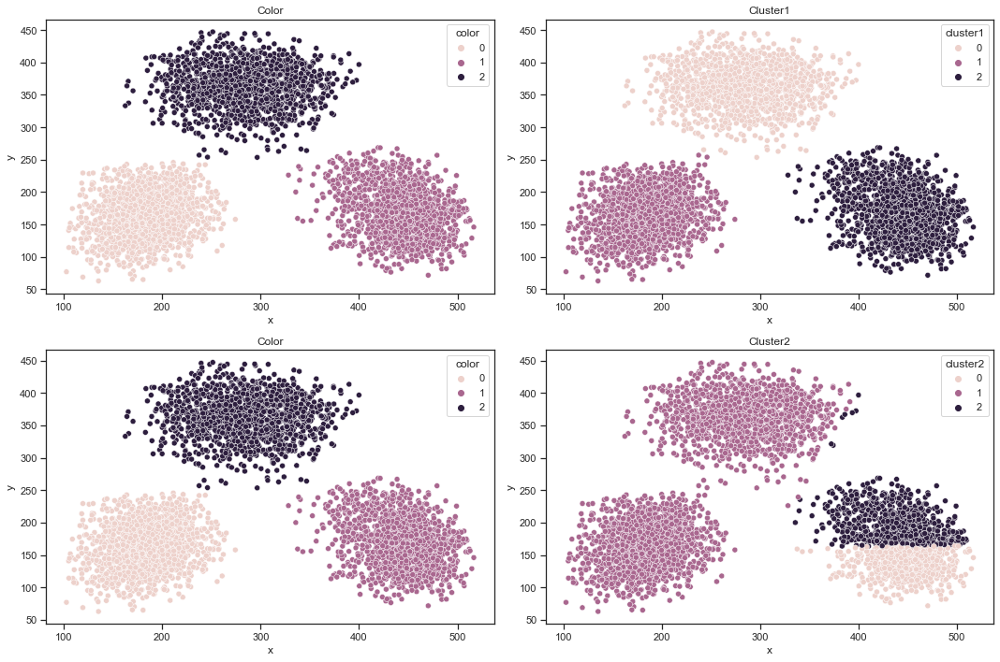

In [132]:
df_basic5 = pd.read_csv("./data/exercises/basic5.csv")
clustering1 = MiniBatchKMeans(n_clusters=3)
clustering2 = MiniBatchKMeansNative(n_clusters=3)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_basic5[["x", "y"]].to_numpy())
    labels = clustering.predict(df_basic5[["x", "y"]].to_numpy())
    df_basic5[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_basic5, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_basic5, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_basic5, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_basic5, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

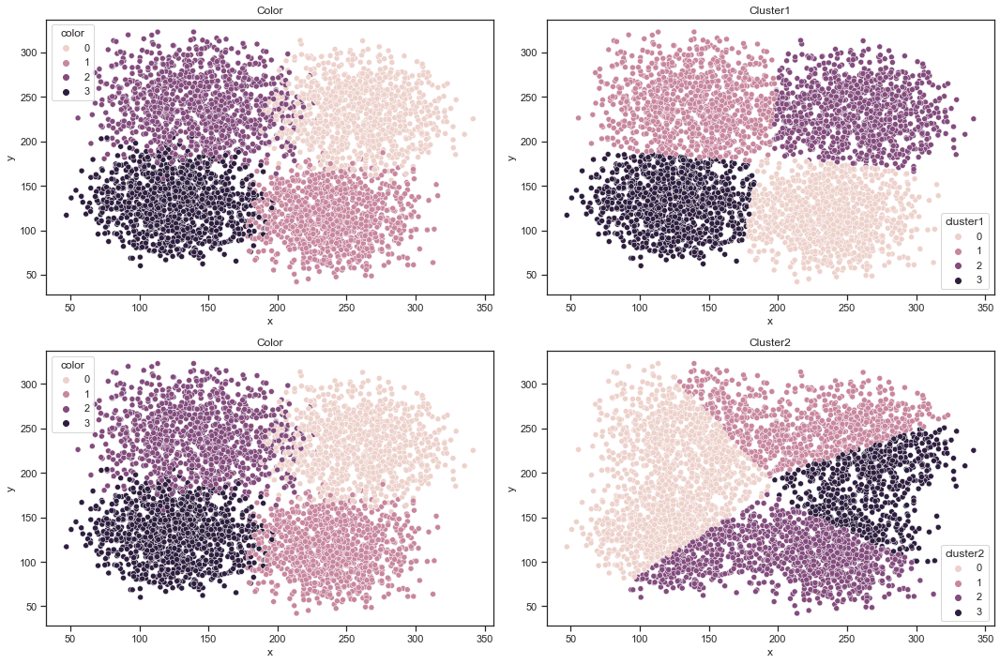

In [133]:
df_blob = pd.read_csv("./data/exercises/blob.csv")
clustering1 = MiniBatchKMeans(n_clusters=4)
clustering2 = MiniBatchKMeansNative(n_clusters=4)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_blob[["x", "y"]].to_numpy())
    labels = clustering.predict(df_blob[["x", "y"]].to_numpy())
    df_blob[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_blob, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_blob, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_blob, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_blob, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

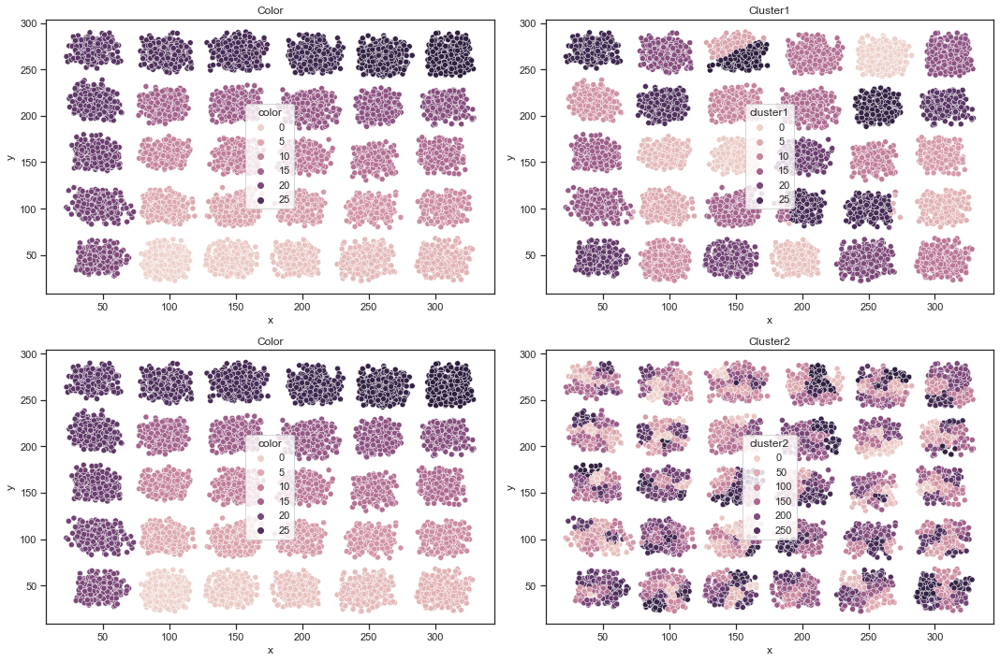

In [140]:
df_boxes = pd.read_csv("./data/exercises/boxes.csv")
clustering1 = MiniBatchKMeans(n_clusters=30)
clustering2 = MiniBatchKMeansNative(n_clusters=300)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_boxes[["x", "y"]].to_numpy())
    labels = clustering.predict(df_boxes[["x", "y"]].to_numpy())
    df_boxes[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_boxes, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_boxes, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_boxes, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_boxes, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

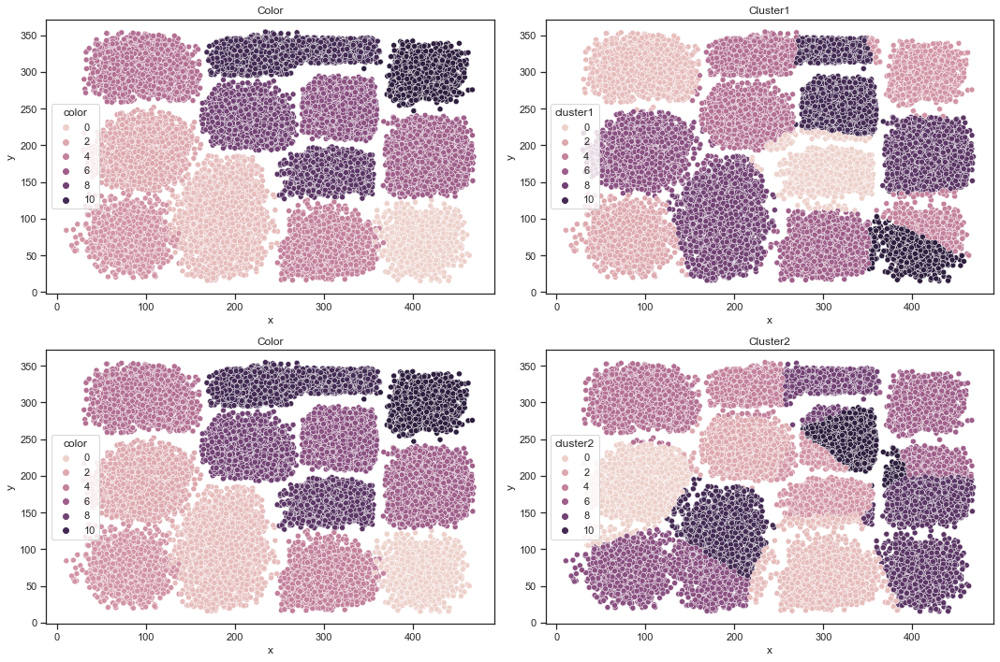

In [135]:
df_boxes3 = pd.read_csv("./data/exercises/boxes3.csv")
clustering1 = MiniBatchKMeans(n_clusters=12)
clustering2 = MiniBatchKMeansNative(n_clusters=12)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_boxes3[["x", "y"]].to_numpy())
    labels = clustering.predict(df_boxes3[["x", "y"]].to_numpy())
    df_boxes3[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_boxes3, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_boxes3, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_boxes3, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_boxes3, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

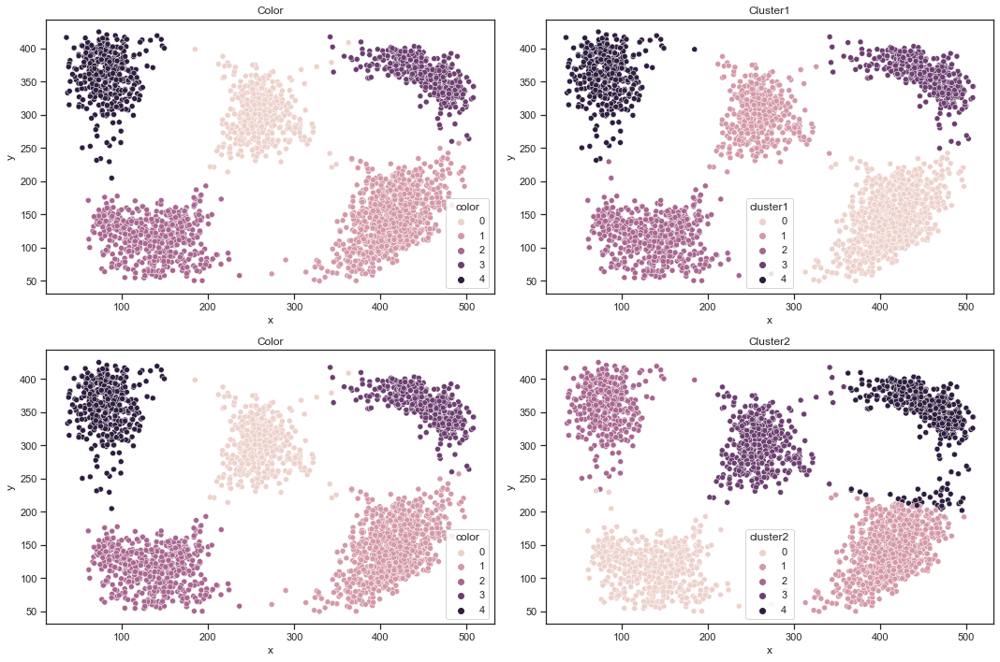

In [136]:
df_network = pd.read_csv("./data/exercises/network.csv")
clustering1 = MiniBatchKMeans(n_clusters=5)
clustering2 = MiniBatchKMeansNative(n_clusters=5)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_network[["x", "y"]].to_numpy())
    labels = clustering.predict(df_network[["x", "y"]].to_numpy())
    df_network[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_network, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_network, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_network, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_network, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

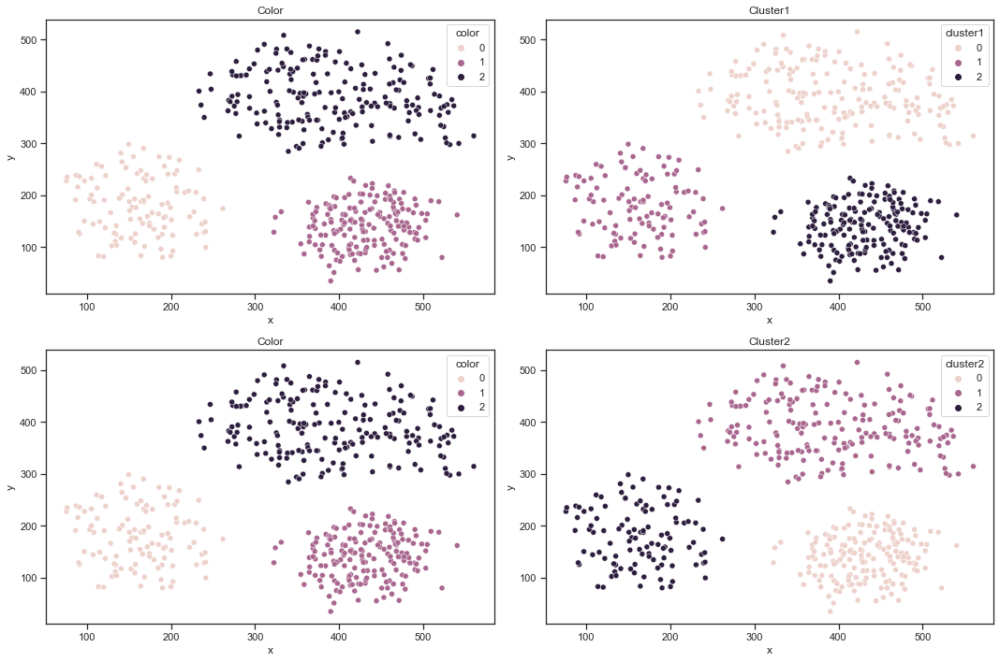

In [137]:
df_sparse = pd.read_csv("./data/exercises/sparse.csv")
clustering1 = MiniBatchKMeans(n_clusters=3)
clustering2 = MiniBatchKMeansNative(n_clusters=3)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_sparse[["x", "y"]].to_numpy())
    labels = clustering.predict(df_sparse[["x", "y"]].to_numpy())
    df_sparse[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_sparse, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_sparse, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_sparse, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_sparse, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

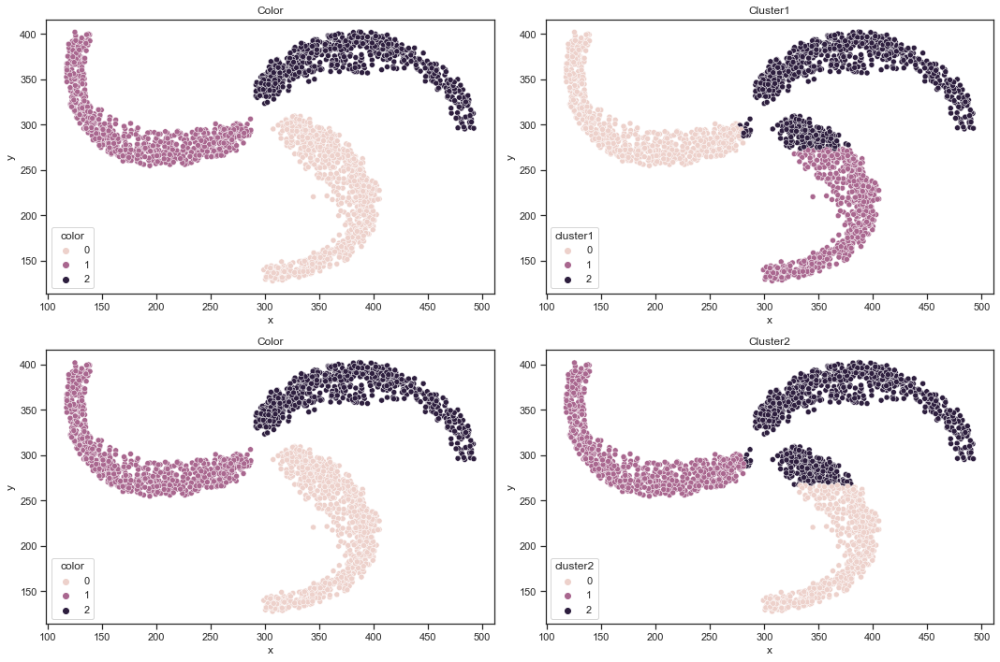

In [138]:
df_spirals = pd.read_csv("./data/exercises/spirals.csv")
clustering1 = MiniBatchKMeans(n_clusters=3)
clustering2 = MiniBatchKMeansNative(n_clusters=3)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_spirals[["x", "y"]].to_numpy())
    labels = clustering.predict(df_spirals[["x", "y"]].to_numpy())
    df_spirals[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_spirals, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_spirals, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_spirals, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_spirals, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

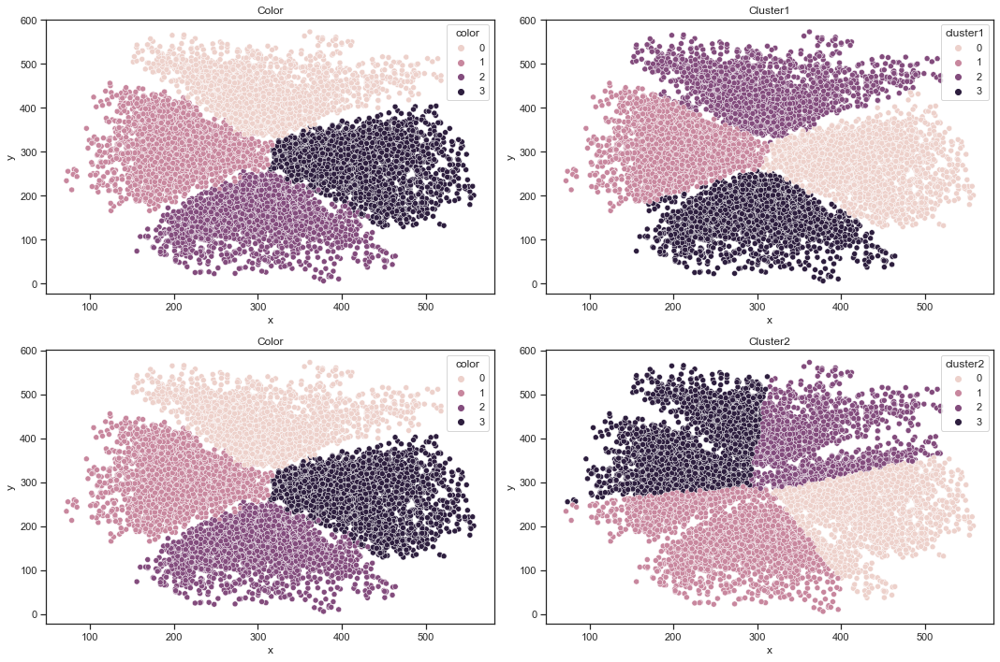

In [139]:
df_supernova = pd.read_csv("./data/exercises/supernova.csv")
clustering1 = MiniBatchKMeans(n_clusters=4)
clustering2 = MiniBatchKMeansNative(n_clusters=4)

i=0
for clustering in [clustering1,clustering2]:
    i+=1
    clustering.fit(df_supernova[["x", "y"]].to_numpy())
    labels = clustering.predict(df_supernova[["x", "y"]].to_numpy())
    df_supernova[f'cluster{i}'] = labels

fig, ax = plt.subplots(2, 2, figsize=(15,10))
sns.scatterplot(data=df_supernova, x='x', y='y', hue='color', ax=ax[0,0])
ax[0,0].set_title('Color')
sns.scatterplot(data=df_supernova, x='x', y='y', hue='cluster1', ax=ax[0,1])
ax[0,1].set_title('Cluster1')

sns.scatterplot(data=df_supernova, x='x', y='y', hue='color', ax=ax[1,0])
ax[1,0].set_title('Color')
sns.scatterplot(data=df_supernova, x='x', y='y', hue='cluster2', ax=ax[1,1])
ax[1,1].set_title('Cluster2')

plt.tight_layout()
plt.show()

### 3.?.2. Wine Dataset for Clustering

In [19]:
df_wine = pd.read_csv("./data/wine-clustering.csv")
df_wine.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [25]:

# Criando o pipeline
pipeline_wine = make_pipeline(
    StandardScaler(),
    MiniBatchKMeans(n_clusters=5)
)

# Treinando o pipeline
pipeline_wine.fit(df_wine)

# Obtendo as etiquetas dos clusters
labels = pipeline_wine.predict(df_wine)

# Adicionando as etiquetas dos clusters ao DataFrame
df_wine['cluster'] = labels

# Exibindo o DataFrame com as etiquetas dos clusters
df_wine.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,cluster
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,4
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,4
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,4
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,3


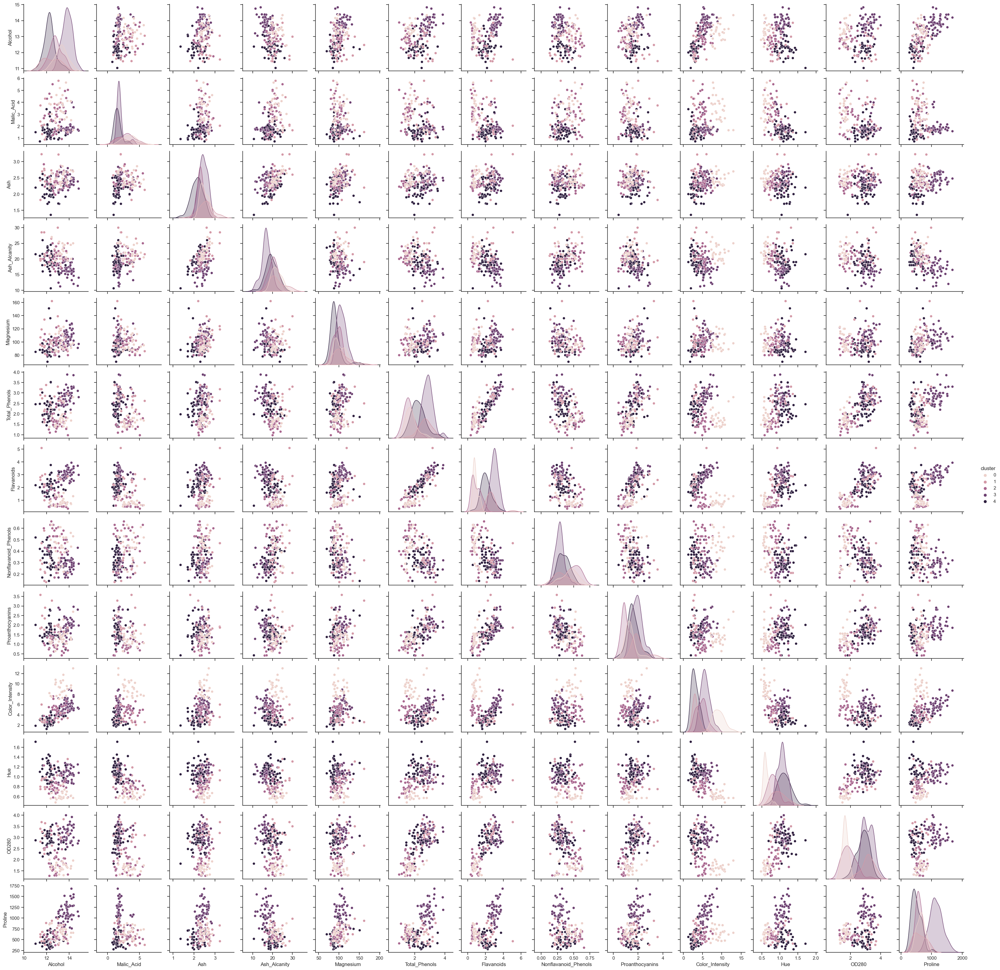

In [21]:
sns.pairplot(df_wine, hue="cluster")

### 3.?.3. Credit Card Dataset for Clustering

In [22]:
df_credit_card = pd.read_csv("./data/credit-card-clustering.csv")
df_credit_card.drop(labels=["CUST_ID"], axis=1, inplace=True)

print(df_credit_card.isna().sum())

df_credit_card['CREDIT_LIMIT'].fillna(0, inplace=True)
df_credit_card['MINIMUM_PAYMENTS'].fillna(0, inplace=True)

df_credit_card.head()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [23]:
# Criando o pipeline
pipeline_credit_card = make_pipeline(
    StandardScaler(),
    MiniBatchKMeans(n_clusters=5)
)

# Treinando o pipeline
pipeline_credit_card.fit(df_credit_card)

# Obtendo as etiquetas dos clusters
labels = pipeline_credit_card.predict(df_credit_card)

# Adicionando as etiquetas dos clusters ao DataFrame
df_credit_card['cluster'] = labels

# Exibindo o DataFrame com as etiquetas dos clusters
df_credit_card.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,4
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,4
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,4
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,4
